In [ ]:
#starting by installing and importing libraries for my data analysis

In [ ]:
! pip install folium

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium

In [ ]:
#importing my data into my notebook

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/202312-citibike-tripdata.csv')

<ipython-input-7-1ba428a21713>:1: DtypeWarning: Columns (5,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/202312-citibike-tripdata.csv')


In [ ]:
#getting to know my data

In [ ]:
df.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,FB18F431791D6F97,classic_bike,2023-12-07 12:40:22,2023-12-07 12:47:09,Allen St & Stanton St,5484.09,Carmine St & 6 Ave,5763.03,40.721818,-73.989172,40.730386,-74.002150,member
1,73DF56B794079C50,classic_bike,2023-12-29 13:47:27,2023-12-29 13:54:02,Carlton Ave & Dean St,4199.12,Union St & 4 Ave,4175.15,40.680974,-73.971010,40.677274,-73.982820,member
2,E3BA5AF851CC1CF0,classic_bike,2023-12-14 19:57:46,2023-12-14 20:15:12,W 84 St & Amsterdam Ave,7409.04,W 48 St & Rockefeller Plaza,6626.11,40.786249,-73.975446,40.757769,-73.979294,member
3,8F2CBCCB503B0398,electric_bike,2023-12-20 16:55:15,2023-12-20 17:04:03,E 85 St & York Ave,7146.04,Central Park West & W 85 St,7354.01,40.775369,-73.948034,40.784760,-73.969862,member
4,A28FFC9585DE8CC5,classic_bike,2023-12-30 14:43:15,2023-12-30 14:56:33,W 84 St & Amsterdam Ave,7409.04,E 58 St & 3 Ave,6762.02,40.786238,-73.975478,40.760958,-73.967245,member


In [ ]:
df.tail()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
2273660,796BC679FFED8FB8,classic_bike,2023-12-14 10:01:36,2023-12-14 10:02:31,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.98714,member
2273661,A8FFE1251749A510,classic_bike,2023-12-14 10:13:42,2023-12-14 10:14:27,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.98714,member
2273662,AC14339B505A0000,classic_bike,2023-12-14 10:09:56,2023-12-14 10:10:44,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.98714,member
2273663,FC3702FD4319EC93,classic_bike,2023-12-14 10:03:47,2023-12-14 10:04:36,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.98714,member
2273664,930E4226552E06D8,classic_bike,2023-12-17 13:15:50,2023-12-17 13:16:46,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.98714,member


In [ ]:
df.shape

(2273665, 13)

In [ ]:
df.describe()

,start_lat,start_lng,end_lat,end_lng
count,2.273665e+06,2.273665e+06,2.272683e+06,2.272683e+06
mean,4.073933e+01,-7.397168e+01,4.073924e+01,-7.397187e+01
std,4.053187e-02,2.874801e-02,4.039330e-02,2.870971e-02
min,4.058913e+01,-7.402696e+01,4.056000e+01,-7.430000e+01
25%,4.071497e+01,-7.399193e+01,4.071512e+01,-7.399194e+01
50%,4.073866e+01,-7.397974e+01,4.073827e+01,-7.397983e+01
75%,4.076243e+01,-7.395559e+01,4.076227e+01,-7.395577e+01
max,4.088635e+01,-7.381737e+01,4.090000e+01,-7.375000e+01


In [ ]:
df.describe

<bound method NDFrame.describe of                   ride_id  rideable_type           started_at  \
0        FB18F431791D6F97   classic_bike  2023-12-07 12:40:22   
1        73DF56B794079C50   classic_bike  2023-12-29 13:47:27   
2        E3BA5AF851CC1CF0   classic_bike  2023-12-14 19:57:46   
3        8F2CBCCB503B0398  electric_bike  2023-12-20 16:55:15   
4        A28FFC9585DE8CC5   classic_bike  2023-12-30 14:43:15   
...                   ...            ...                  ...   
2273660  796BC679FFED8FB8   classic_bike  2023-12-14 10:01:36   
2273661  A8FFE1251749A510   classic_bike  2023-12-14 10:13:42   
2273662  AC14339B505A0000   classic_bike  2023-12-14 10:09:56   
2273663  FC3702FD4319EC93   classic_bike  2023-12-14 10:03:47   
2273664  930E4226552E06D8   classic_bike  2023-12-17 13:15:50   

                    ended_at       start_station_name start_station_id  \
0        2023-12-07 12:47:09    Allen St & Stanton St          5484.09   
1        2023-12-29 13:54:02    Carlt

In [ ]:
df.median()

<ipython-input-14-6d467abf240d>:1: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.median()


start_lat    40.738661
start_lng   -73.979738
end_lat      40.738274
end_lng     -73.979827
dtype: float64

In [ ]:
#from here I want to do some cleaning to narrow my analysis

In [ ]:
df.dropna()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,FB18F431791D6F97,classic_bike,2023-12-07 12:40:22,2023-12-07 12:47:09,Allen St & Stanton St,5484.09,Carmine St & 6 Ave,5763.03,40.721818,-73.989172,40.730386,-74.002150,member
1,73DF56B794079C50,classic_bike,2023-12-29 13:47:27,2023-12-29 13:54:02,Carlton Ave & Dean St,4199.12,Union St & 4 Ave,4175.15,40.680974,-73.971010,40.677274,-73.982820,member
2,E3BA5AF851CC1CF0,classic_bike,2023-12-14 19:57:46,2023-12-14 20:15:12,W 84 St & Amsterdam Ave,7409.04,W 48 St & Rockefeller Plaza,6626.11,40.786249,-73.975446,40.757769,-73.979294,member
3,8F2CBCCB503B0398,electric_bike,2023-12-20 16:55:15,2023-12-20 17:04:03,E 85 St & York Ave,7146.04,Central Park West & W 85 St,7354.01,40.775369,-73.948034,40.784760,-73.969862,member
4,A28FFC9585DE8CC5,classic_bike,2023-12-30 14:43:15,2023-12-30 14:56:33,W 84 St & Amsterdam Ave,7409.04,E 58 St & 3 Ave,6762.02,40.786238,-73.975478,40.760958,-73.967245,member
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2273660,796BC679FFED8FB8,classic_bike,2023-12-14 10:01:36,2023-12-14 10:02:31,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.987140,member
2273661,A8FFE1251749A510,classic_bike,2023-12-14 10:13:42,2023-12-14 10:14:27,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.987140,member
2273662,AC14339B505A0000,classic_bike,2023-12-14 10:09:56,2023-12-14 10:10:44,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.987140,member
2273663,FC3702FD4319EC93,classic_bike,2023-12-14 10:03:47,2023-12-14 10:04:36,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.987140,member


In [ ]:
df2 = df.dropna()
df2

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,FB18F431791D6F97,classic_bike,2023-12-07 12:40:22,2023-12-07 12:47:09,Allen St & Stanton St,5484.09,Carmine St & 6 Ave,5763.03,40.721818,-73.989172,40.730386,-74.002150,member
1,73DF56B794079C50,classic_bike,2023-12-29 13:47:27,2023-12-29 13:54:02,Carlton Ave & Dean St,4199.12,Union St & 4 Ave,4175.15,40.680974,-73.971010,40.677274,-73.982820,member
2,E3BA5AF851CC1CF0,classic_bike,2023-12-14 19:57:46,2023-12-14 20:15:12,W 84 St & Amsterdam Ave,7409.04,W 48 St & Rockefeller Plaza,6626.11,40.786249,-73.975446,40.757769,-73.979294,member
3,8F2CBCCB503B0398,electric_bike,2023-12-20 16:55:15,2023-12-20 17:04:03,E 85 St & York Ave,7146.04,Central Park West & W 85 St,7354.01,40.775369,-73.948034,40.784760,-73.969862,member
4,A28FFC9585DE8CC5,classic_bike,2023-12-30 14:43:15,2023-12-30 14:56:33,W 84 St & Amsterdam Ave,7409.04,E 58 St & 3 Ave,6762.02,40.786238,-73.975478,40.760958,-73.967245,member
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2273660,796BC679FFED8FB8,classic_bike,2023-12-14 10:01:36,2023-12-14 10:02:31,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.987140,member
2273661,A8FFE1251749A510,classic_bike,2023-12-14 10:13:42,2023-12-14 10:14:27,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.987140,member
2273662,AC14339B505A0000,classic_bike,2023-12-14 10:09:56,2023-12-14 10:10:44,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.987140,member
2273663,FC3702FD4319EC93,classic_bike,2023-12-14 10:03:47,2023-12-14 10:04:36,St Marks Pl & 1 Ave,5626.13,St Marks Pl & 2 Ave,5669.1,40.727791,-73.985649,40.728419,-73.987140,member


In [ ]:
df2.shape

(2266408, 13)

In [ ]:
#After cleaning the data a bit we see the shape of the dataset has changed with regards to the rows

In [ ]:
#Now I want to familarize myself with the data a bit more and add some graphs to visualize my data as well

In [ ]:
df2['start_station_name'].value_counts().head()

Forsyth St & Broome St       9407
W 21 St & 6 Ave              9097
Delancey St & Eldridge St    8240
Broadway & E 14 St           7469
Broadway & W 58 St           7334
Name: start_station_name, dtype: int64

<Axes: >

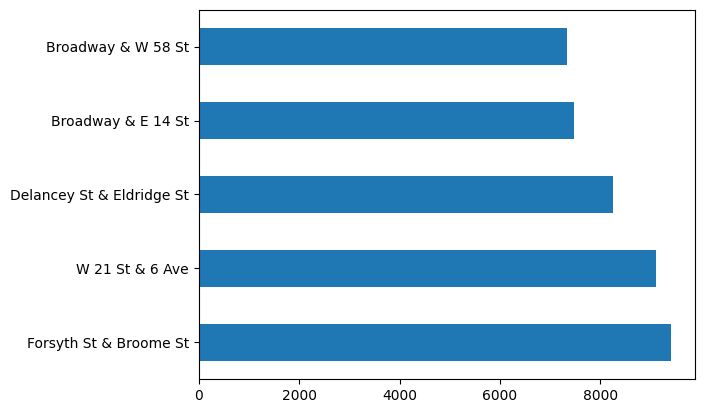

In [ ]:
df2['start_station_name'].value_counts().head().plot(kind='barh')

In [ ]:
df2['start_station_name'].value_counts().tail()

Newark Ave          1
7 St & Monroe St    1
Adams St & 2 St     1
Van Vorst Park      1
Hamilton Park       1
Name: start_station_name, dtype: int64

<Axes: >

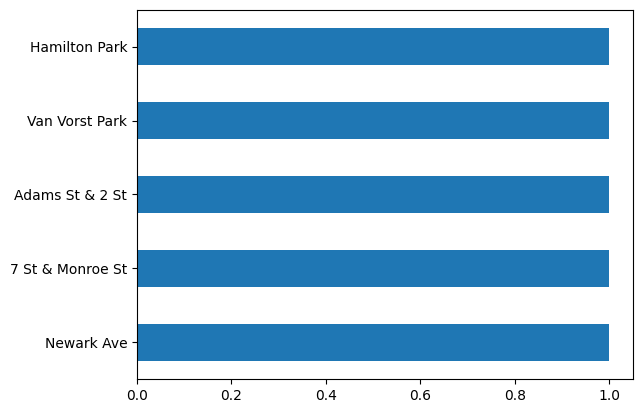

In [ ]:
df2['start_station_name'].value_counts().tail().plot(kind='barh')

In [ ]:
df2['end_station_name'].value_counts().head()

Forsyth St & Broome St       9505
W 21 St & 6 Ave              9153
Delancey St & Eldridge St    8255
Broadway & E 14 St           7510
Broadway & W 58 St           7418
Name: end_station_name, dtype: int64

<Axes: >

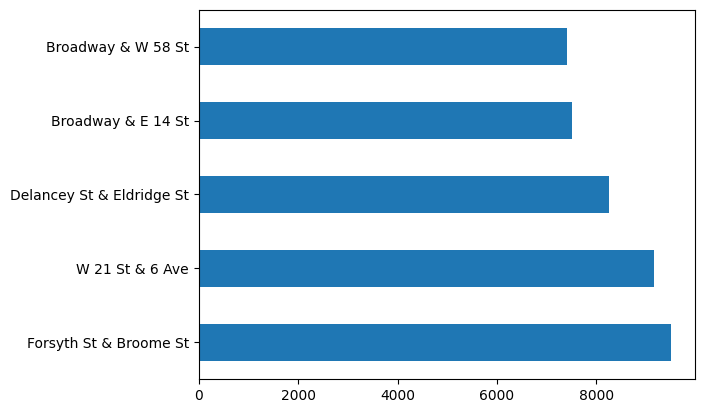

In [ ]:
df2['end_station_name'].value_counts().head().plot(kind='barh')

In [ ]:
df2['end_station_name'].value_counts().tail()

Madison St & 1 St                   1
River St & 1 St                     1
City Hall - Washington St & 1 St    1
Washington St                       1
Hamilton Park                       1
Name: end_station_name, dtype: int64

<Axes: >

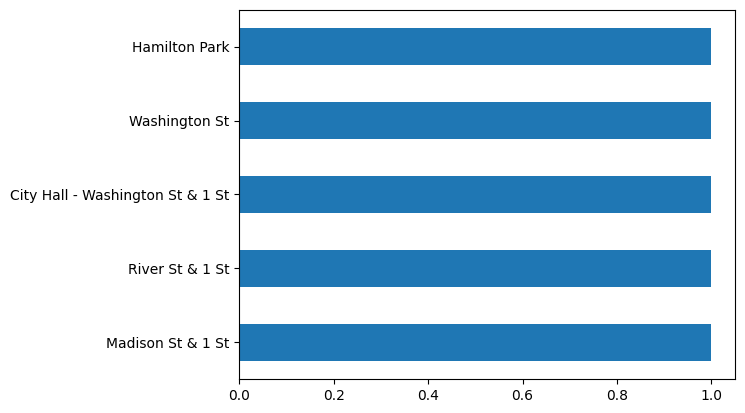

In [ ]:
df2['end_station_name'].value_counts().tail().plot(kind='barh')

In [ ]:
#I wanted to make sure the data was clean, and also ensure the information mentioned with the Longitude and Latitude match the information
#represented above

In [ ]:
df2['start_lat'].value_counts().head()

40.718939    8212
40.719383    7605
40.741740    4625
40.730311    4156
40.734546    3497
Name: start_lat, dtype: int64

In [ ]:
df2['start_lng'].value_counts().head()

-73.992663    8212
-73.991479    7605
-73.994156    4625
-73.980472    4156
-73.990741    3497
Name: start_lng, dtype: int64

<Axes: >

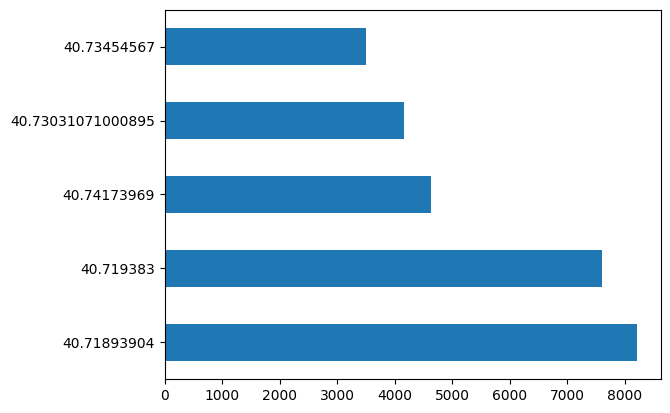

In [ ]:
df2['start_lat'].value_counts().head().plot(kind='barh')

<Axes: >

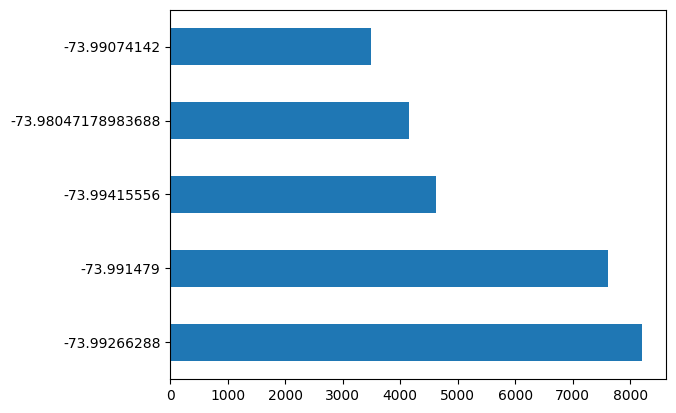

In [ ]:
df2['start_lng'].value_counts().head().plot(kind='barh')

In [ ]:
df2['start_lat'].value_counts().tail()

40.768755    1
40.778228    1
40.769008    1
40.702426    1
40.727731    1
Name: start_lat, dtype: int64

In [ ]:
df2['start_lng'].value_counts().tail()

-74.013228    1
-74.015027    1
-73.929351    1
-73.922726    1
-74.013401    1
Name: start_lng, dtype: int64

<Axes: >

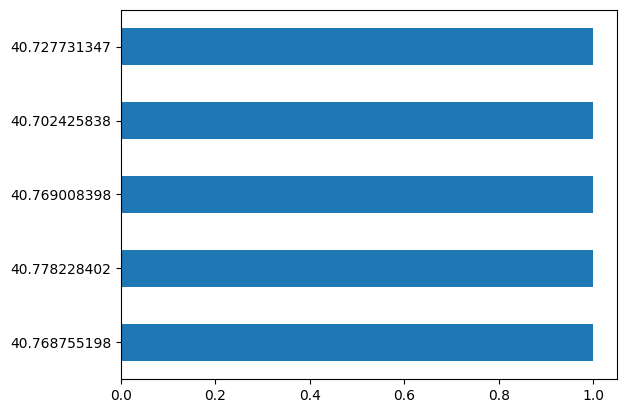

In [ ]:
df2['start_lat'].value_counts().tail().plot(kind='barh')

<Axes: >

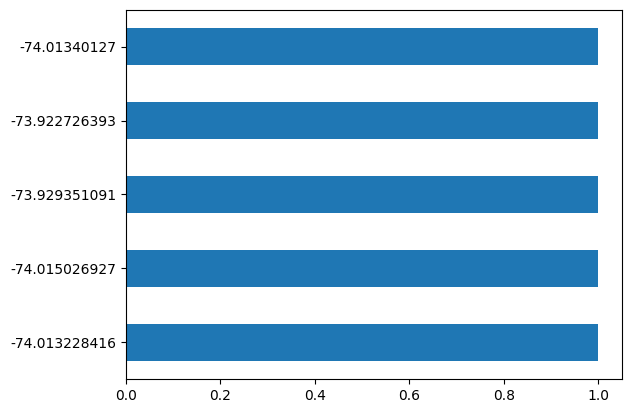

In [ ]:
df2['start_lng'].value_counts().tail().plot(kind='barh')

In [ ]:
df2['end_lat'].value_counts().head()

40.718939    9505
40.741740    9153
40.719383    8255
40.734546    7510
40.766953    7418
Name: end_lat, dtype: int64

In [ ]:
df2['end_lng'].value_counts().head()

-73.992663    9505
-73.994156    9153
-73.991479    8255
-73.990741    7510
-73.981693    7418
Name: end_lng, dtype: int64

In [ ]:
df2['end_lat'].value_counts().tail()

40.724294    1
40.737215    1
40.739814    1
40.738790    1
40.739153    1
Name: end_lat, dtype: int64

In [ ]:
df2['end_lng'].value_counts().tail()

-74.037977    1
-74.044247    1
-74.039300    1
-74.028865    1
-74.046964    1
Name: end_lng, dtype: int64

<Axes: >

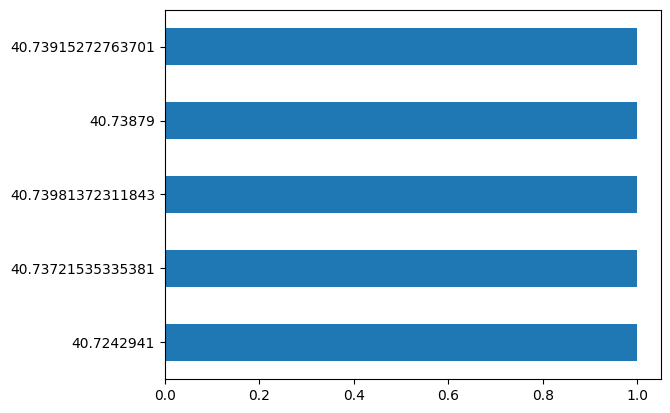

In [ ]:
df2['end_lat'].value_counts().tail().plot(kind='barh')

<Axes: >

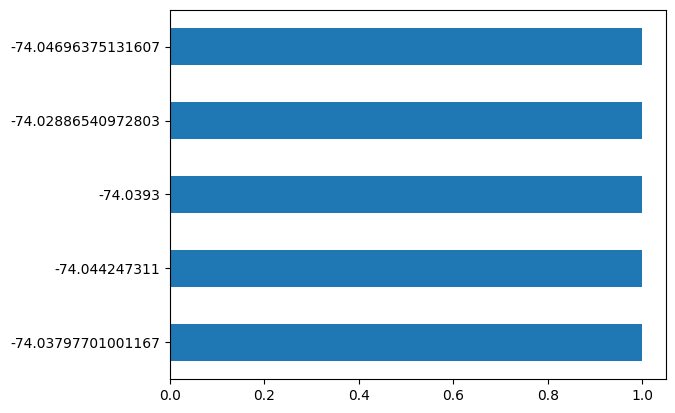

In [ ]:
df2['end_lng'].value_counts().tail().plot(kind='barh')

In [ ]:
#I have verified in google maps the coordinates provided match with the station names provided for the top 5 and bottom 5 (images were provided in my powerpoint deck)

In [ ]:
#I now want to create a visualization on a map to see the areas where CitiBike utilization are located

In [ ]:
df2.coulmns = df2.columns.str.strip()
df2.head()

<ipython-input-44-1e5905ab2abe>:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df2.coulmns = df2.columns.str.strip()


,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,FB18F431791D6F97,classic_bike,2023-12-07 12:40:22,2023-12-07 12:47:09,Allen St & Stanton St,5484.09,Carmine St & 6 Ave,5763.03,40.721818,-73.989172,40.730386,-74.002150,member
1,73DF56B794079C50,classic_bike,2023-12-29 13:47:27,2023-12-29 13:54:02,Carlton Ave & Dean St,4199.12,Union St & 4 Ave,4175.15,40.680974,-73.971010,40.677274,-73.982820,member
2,E3BA5AF851CC1CF0,classic_bike,2023-12-14 19:57:46,2023-12-14 20:15:12,W 84 St & Amsterdam Ave,7409.04,W 48 St & Rockefeller Plaza,6626.11,40.786249,-73.975446,40.757769,-73.979294,member
3,8F2CBCCB503B0398,electric_bike,2023-12-20 16:55:15,2023-12-20 17:04:03,E 85 St & York Ave,7146.04,Central Park West & W 85 St,7354.01,40.775369,-73.948034,40.784760,-73.969862,member
4,A28FFC9585DE8CC5,classic_bike,2023-12-30 14:43:15,2023-12-30 14:56:33,W 84 St & Amsterdam Ave,7409.04,E 58 St & 3 Ave,6762.02,40.786238,-73.975478,40.760958,-73.967245,member


In [ ]:
subset_of_df2 = df2.sample(n=10000)

In [ ]:
some_map = folium.Map(location=[subset_of_df2 ['start_lat'].mean(),
                                subset_of_df2['start_lng'].mean()],
                                  zoom_start=10)

In [ ]:
for row in subset_of_df2.itertuples():

  some_map.add_child(folium.Marker(location=[row.start_lat,row.start_lng], popup=row.start_station_name))

In [ ]:
some_map

In [49]:
from folium.plugins import MarkerCluster

In [50]:
some_map_2 = folium.Map(location=[subset_of_df2 ['start_lat'].mean(),
                                subset_of_df2['start_lng'].mean()],
                                  zoom_start=10)

In [51]:
mc=MarkerCluster()

In [52]:
for row in subset_of_df2.itertuples():
    mc.add_child(folium.Marker(location=[row.start_lat,row.start_lng], popup=row.start_station_name))

In [53]:
some_map_2.add_child(mc)

After analyzing my data, I have concluded that in order to generate a marketing campaign we need to take a look at the areas that have more CitiBike utilization, for example the Bowery area, and compare it to areas with litle CitiBike Utilization like 40th Street and 5th Avenue.

We would want to take a look as to why the areas of high utilization have such a high demand, and analyze the area for information such as: What businesses are in the areas, how much public transportation is in the area, demographics, etc.

With this being said more information would need to be gathered to execute a complete Marketing Campaign to generate more business for CitiBike in the areas that do not see such high demand

